In [66]:
# Import statements
import skimage
import numpy as np

%matplotlib widget
from matplotlib import pyplot as plt

from skimage import io

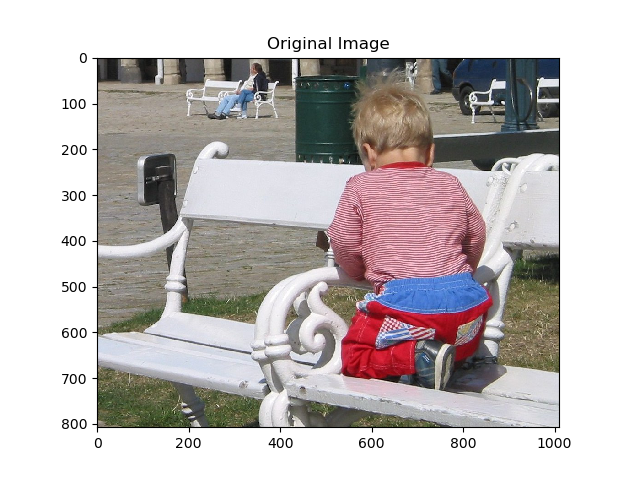

Size: (808, 1010, 3)


In [67]:
# Import the image file
data_path = "../data/Discussion1/"
image = io.imread(data_path + "Ondra_sampling.jpg")
plt.imshow(image, interpolation='nearest')
plt.title("Original Image")
plt.show()
print("Size: " + str(image.shape))

C:\Users\Rucho\AppData\Local\Temp\ipykernel_28932\3222696730.py:32: UserWarning: ../data/Discussion1/Ondra_blue.jpg is a low contrast image
  io.imsave(data_path + "Ondra_blue.jpg", blue)


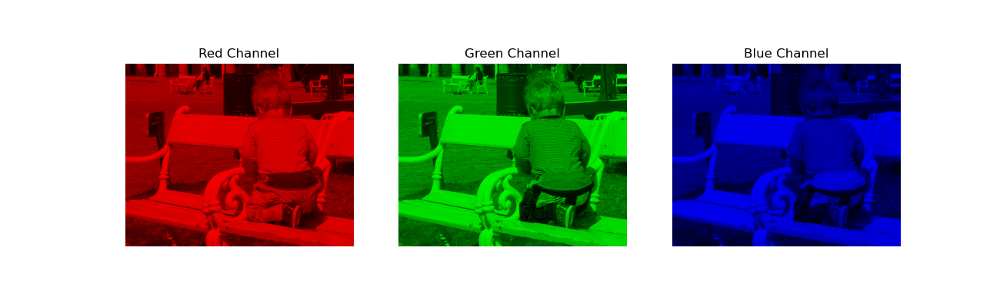

In [68]:
# Extract the red, blue, and green channels of the image
# Use list slices to set/copy specific channels of the array
red = image.copy()
green = image.copy()
blue = image.copy()

# Create a figure for the outputs
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(13, 4))

# Red image (X, 0, 0)
red[:,:,1] = 0
red[:,:,2] = 0
ax1.imshow(red)
ax1.set_title("Red Channel")
ax1.set_axis_off()
io.imsave(data_path + "Ondra_red.jpg", red)

# Green image (0, X, 0)
green[:,:,0] = 0
green[:,:,2] = 0
ax2.imshow(green)
ax2.set_title("Green Channel")
ax2.set_axis_off()
io.imsave(data_path + "Ondra_green.jpg", green)

# Blue image (0, 0, X)
blue[:,:,0] = 0
blue[:,:,1] = 0
ax3.imshow(blue)
ax3.set_title("Blue Channel")
ax3.set_axis_off()
io.imsave(data_path + "Ondra_blue.jpg", blue)

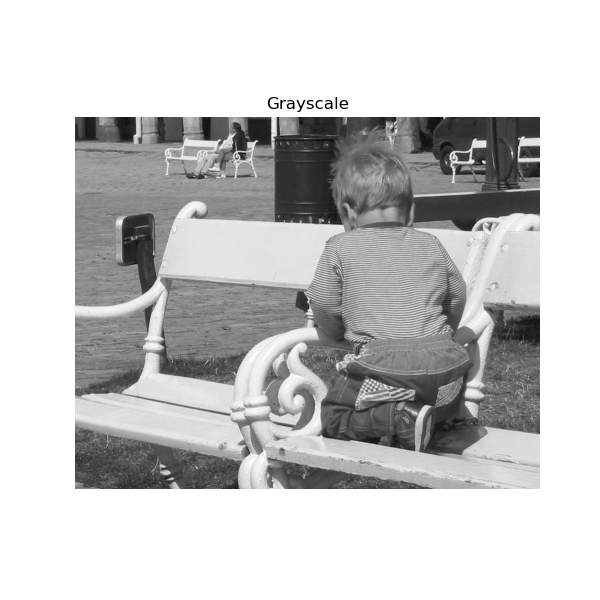

In [69]:
# Create a grayscale image
gray = image.copy()

# Could use rgb2gray, but that uses luminance rather than equal weights for each color
# Manually create gray
for x in range(gray.shape[0]):
    for y in range(gray.shape[1]):
        cols = gray[x,y]
        avg = np.ubyte((int(cols[0]) + int(cols[1]) + int(cols[2])) / 3.0)  # Extra casts are needed to avoid issues with 8bit overflow
        gray[x,y,0] = avg
        gray[x,y,1] = avg
        gray[x,y,2] = avg

# Create a figure and file for the grayscale image
fig, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
ax1.imshow(gray)
ax1.set_title("Grayscale")
ax1.set_axis_off()
io.imsave(data_path + "Ondra_gray.jpg", gray)

(2, 4)


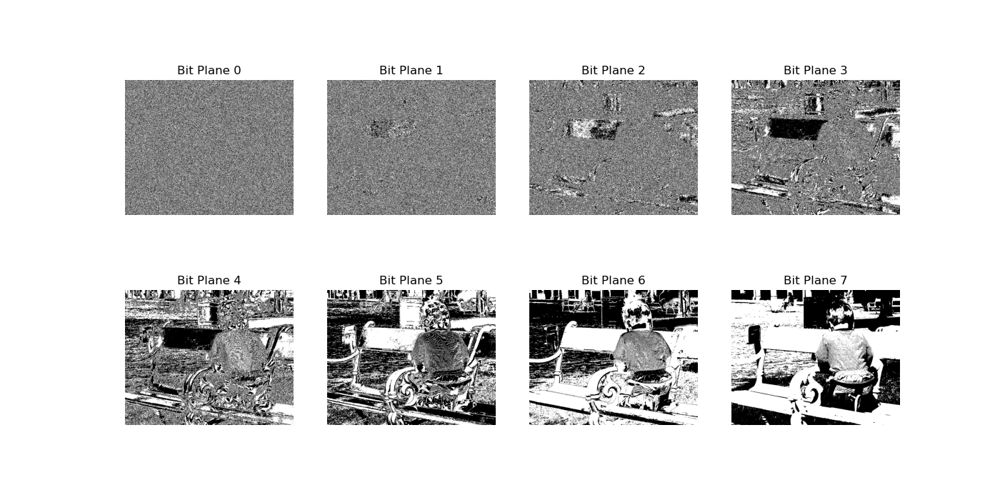

In [70]:
# Display the 8 bit planes of the grayscale image
bit_planes = [gray.copy(), gray.copy(), gray.copy(), gray.copy(), gray.copy(), gray.copy(), gray.copy(), gray.copy()]

# Iterate through each pixel and set each bit plane according to the correct bit plane value
for x in range(gray.shape[0]):
    for y in range(gray.shape[1]):
        val = gray[x,y,0]

        # Iterate through each bit in the 8bit value
        for i in range(8):
            bit = (val & (0x1 << i)) != 0
            bit_planes[i][x,y,0] = 255 if bit else 0
            bit_planes[i][x,y,1] = 255 if bit else 0
            bit_planes[i][x,y,2] = 255 if bit else 0

# Display all of the bit planes
fig, axs = plt.subplots(2, 4, figsize=(14, 7))
print(axs.shape)
for i in range(8):
    axs[int(i / 4), i % 4].imshow(bit_planes[i])
    axs[int(i / 4), i % 4].set_title("Bit Plane " + str(i))
    axs[int(i / 4), i % 4].set_axis_off()

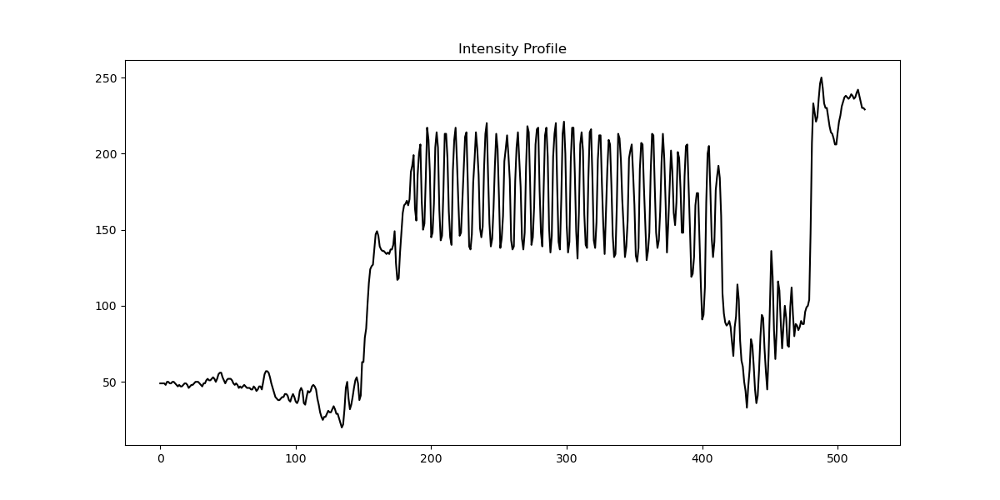

In [71]:
# Display the intensity profile of a line between [460,140] and [872,457].
profile = skimage.measure.profile_line(gray, np.array([140, 460]), np.array([457, 872]))

# Convert the 3D color data into scalar grayscale data
profile = np.array([col[0] for col in profile])

# Plot an intensity graph
fig, (ax1) = plt.subplots(1, 1, figsize=(12, 6))
ax1.set_title("Intensity Profile")
ax1.plot(profile, color='black')

<class 'numpy.uint8'>


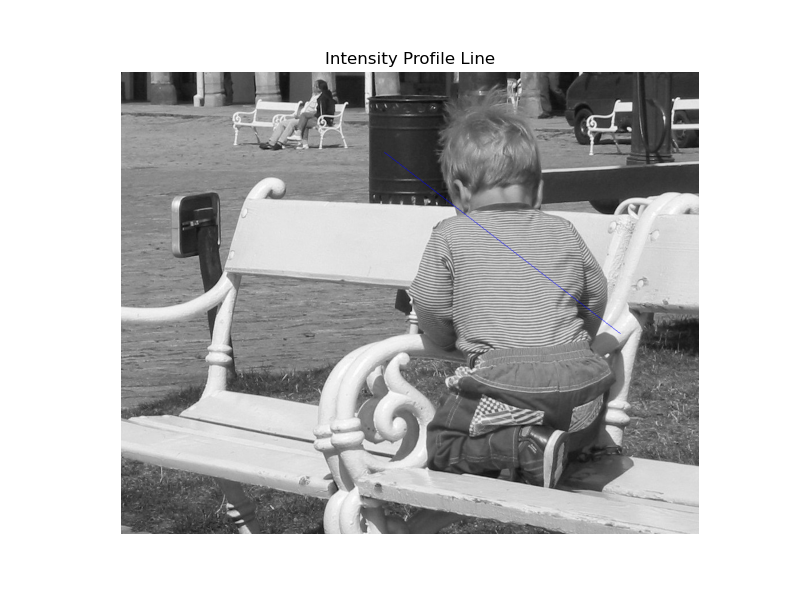

In [72]:
# Display the positioning of the line to help with the next question
gray_copy = gray.copy()
rr, cc = skimage.draw.line(140, 460, 457, 872)
coords = list(zip(rr, cc))
for i in range(len(coords)):
        gray_copy[coords[i][0], coords[i][1]] = np.array([0,0,255])

print(type(gray_copy[0,0,1]))

# Display the image
fig, (ax1) = plt.subplots(1, 1, figsize=(8, 6))
ax1.set_title("Intensity Profile Line")
ax1.imshow(gray_copy)
ax1.set_axis_off()

# What is happening in the image at 200-400 along the line?
The stripes in the child's shirt are causing the intensity to grow and fall with each stripe.

(array([1.2000e+01, 1.5000e+01, 7.0000e+00, 2.5000e+01, 1.9000e+01,
        1.6000e+01, 2.6000e+01, 2.2000e+01, 1.2000e+01, 2.1000e+01,
        3.5000e+01, 2.8000e+01, 3.4000e+01, 4.7000e+01, 5.6000e+01,
        8.2000e+01, 1.0100e+02, 1.3000e+02, 2.0600e+02, 2.8400e+02,
        3.7100e+02, 4.7200e+02, 4.6600e+02, 5.5200e+02, 6.6500e+02,
        6.9300e+02, 7.1200e+02, 8.1200e+02, 1.0030e+03, 1.0840e+03,
        1.3190e+03, 1.5990e+03, 1.5210e+03, 1.6100e+03, 1.5760e+03,
        1.5930e+03, 1.7610e+03, 1.7830e+03, 1.8740e+03, 1.9130e+03,
        1.9430e+03, 2.0930e+03, 2.1640e+03, 2.2890e+03, 2.4870e+03,
        2.7230e+03, 3.2160e+03, 3.7910e+03, 4.3230e+03, 4.5360e+03,
        4.4980e+03, 4.5690e+03, 4.7560e+03, 4.9010e+03, 4.8540e+03,
        4.7980e+03, 4.5620e+03, 4.2650e+03, 4.0290e+03, 3.7820e+03,
        3.5320e+03, 3.6180e+03, 3.5880e+03, 3.7690e+03, 3.7320e+03,
        3.8100e+03, 3.7010e+03, 3.8090e+03, 3.7250e+03, 3.4650e+03,
        3.4260e+03, 3.4080e+03, 3.4130e+03, 3.43

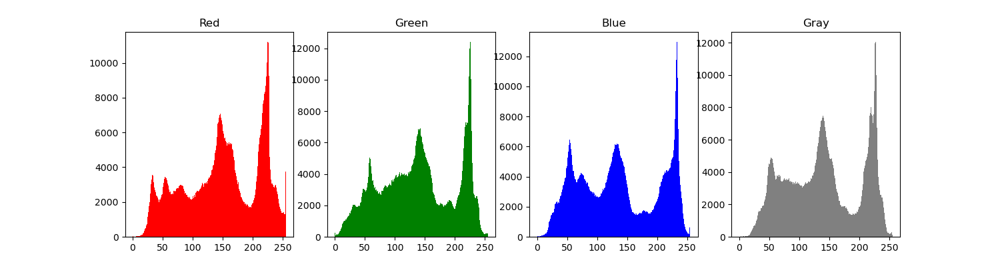

In [73]:
# Plot a histogram for the R, G, B channels of the image. Also plot the gray scale image histogram.
# Reference: https://towardsdatascience.com/histograms-in-image-processing-with-skimage-python-be5938962935

# Create a subplot with 4 graphs
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(15, 4))

# R histogram
ax1.set_title("Red")
ax1.set(ylabel=None)
ax1.hist(image[:,:,0].ravel(), bins=256, color='red')

ax2.set_title("Green")
ax2.set(ylabel=None)
ax2.hist(image[:,:,1].ravel(), bins=256, color='green')

ax3.set_title("Blue")
ax3.set(ylabel=None)
ax3.hist(image[:,:,2].ravel(), bins=256, color='blue')

ax4.set_title("Gray")
ax4.set(ylabel=None)
ax4.hist(gray[:,:,0].ravel(), bins=256, color='gray')


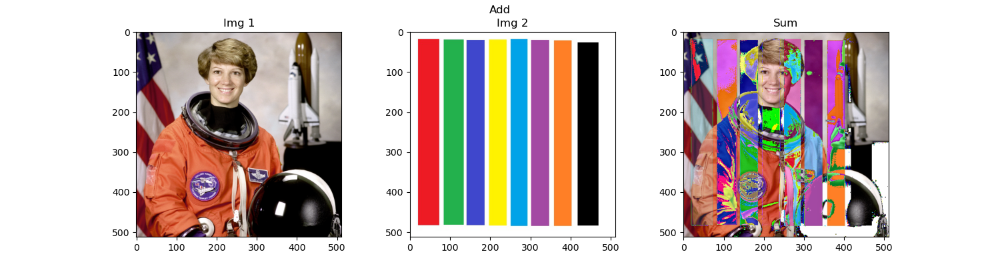

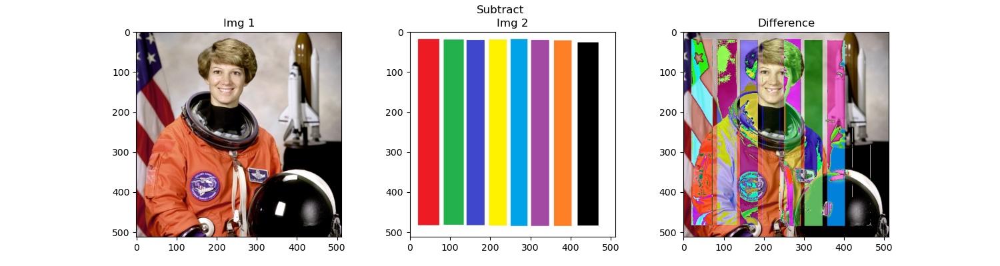

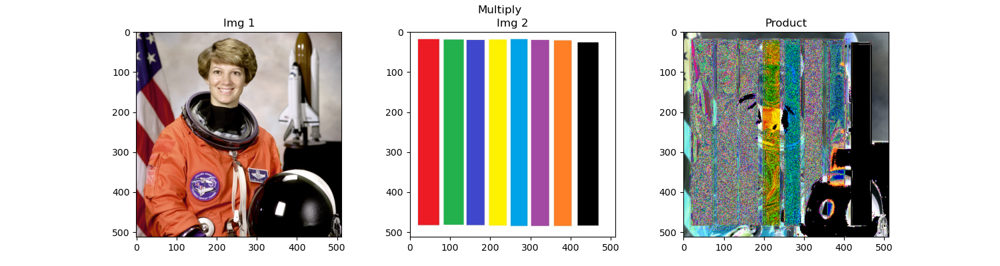

In [74]:
# Add, subtract, multiply
astronaut = skimage.data.astronaut()
mask = io.imread(data_path + "mask.jpg")

# Add
fig_add, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))
fig_add.suptitle("Add")
ax1.set_title("Img 1")
ax2.set_title("Img 2")
ax3.set_title("Sum")

ax1.imshow(astronaut)
ax2.imshow(mask)
ax3.imshow(mask + astronaut)

# Subtract
fig_sub, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))
fig_sub.suptitle("Subtract")
ax1.set_title("Img 1")
ax2.set_title("Img 2")
ax3.set_title("Difference")

ax1.imshow(astronaut)
ax2.imshow(mask)
ax3.imshow(astronaut - mask)

# Multiply
fig_mul, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))
fig_mul.suptitle("Multiply")
ax1.set_title("Img 1")
ax2.set_title("Img 2")
ax3.set_title("Product")

ax1.imshow(astronaut)
ax2.imshow(mask)
ax3.imshow(astronaut * mask)

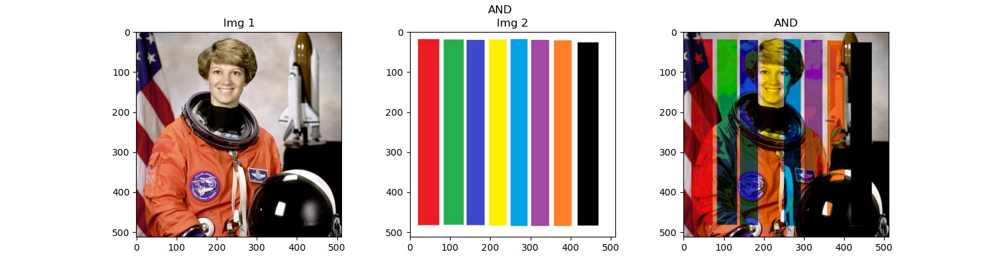

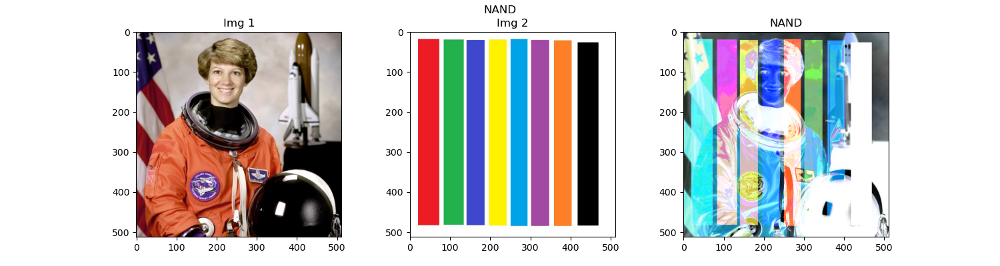

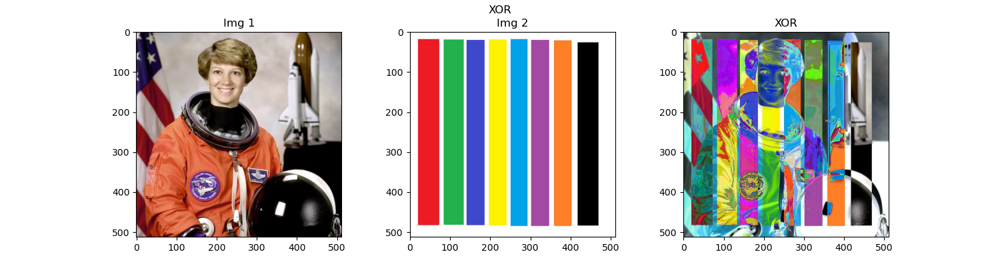

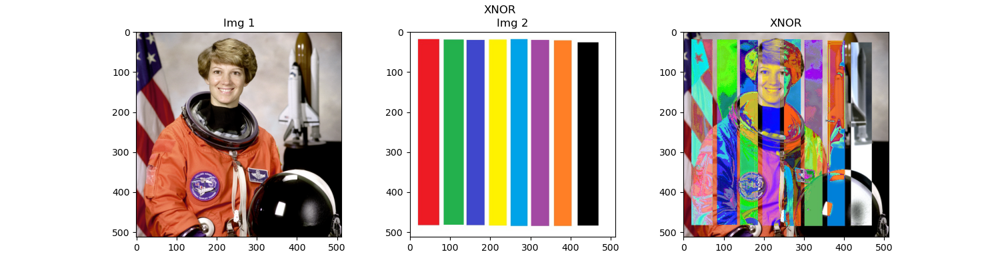

In [75]:
# AND/NAND and XOR/XNOR

# AND/NAND
fig_and, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))
fig_and.suptitle("AND")
ax1.set_title("Img 1")
ax1.imshow(astronaut)
ax2.set_title("Img 2")
ax2.imshow(mask)
and_img = astronaut & mask
ax3.set_title("AND")
ax3.imshow(and_img)

fig_nand, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))
fig_nand.suptitle("NAND")
ax1.set_title("Img 1")
ax1.imshow(astronaut)
ax2.set_title("Img 2")
ax2.imshow(mask)
nand_img = ~(astronaut & mask)
ax3.set_title("NAND")
ax3.imshow(nand_img)

# XOR/XNOR
fig_XOR, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))
fig_XOR.suptitle("XOR")
ax1.set_title("Img 1")
ax1.imshow(astronaut)
ax2.set_title("Img 2")
ax2.imshow(mask)
xor_img = astronaut ^ mask
ax3.set_title("XOR")
ax3.imshow(xor_img)

fig_XNOR, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))
fig_XNOR.suptitle("XNOR")
ax1.set_title("Img 1")
ax1.imshow(astronaut)
ax2.set_title("Img 2")
ax2.imshow(mask)
xnor_img = ~(astronaut ^ mask)
ax3.set_title("XNOR")
ax3.imshow(xnor_img)


Text(0.5, 1.0, 'threshold = 220')

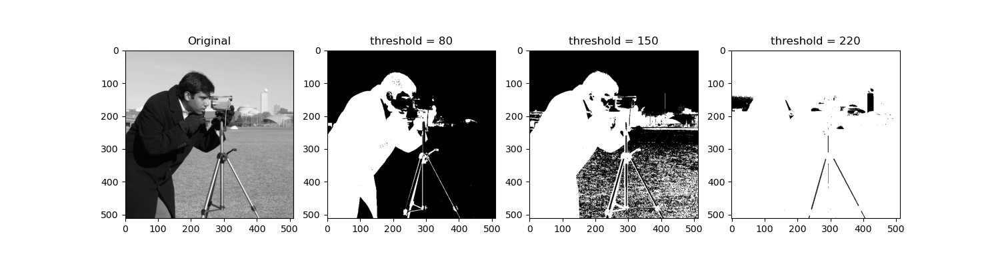

In [76]:
# Threshold - numpy makes this easy
thresholds = [80, 150, 220]
masklow = skimage.data.camera() < thresholds[0]
maskmed = skimage.data.camera() < thresholds[1]
maskhigh = skimage.data.camera() < thresholds[2]


# Display the threshold image
fig_threshold, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(15, 4))

ax1.imshow(skimage.data.camera(), cmap='gray')
ax2.imshow(masklow, cmap='gray')
ax3.imshow(maskmed, cmap='gray')
ax4.imshow(maskhigh, cmap='gray')

ax1.set_title("Original")
ax2.set_title("threshold = " + str(thresholds[0]))
ax3.set_title("threshold = " + str(thresholds[1]))
ax4.set_title("threshold = " + str(thresholds[2]))

C:\Users\Rucho\anaconda3\envs\CprE-535\lib\site-packages\skimage\_shared\utils.py:348: RuntimeWarning: Images with dimensions (M, N, 3) are interpreted as 2D+RGB by default. Use `multichannel=False` to interpret as 3D image with last dimension of length 3.
  return func(*args, **kwargs)


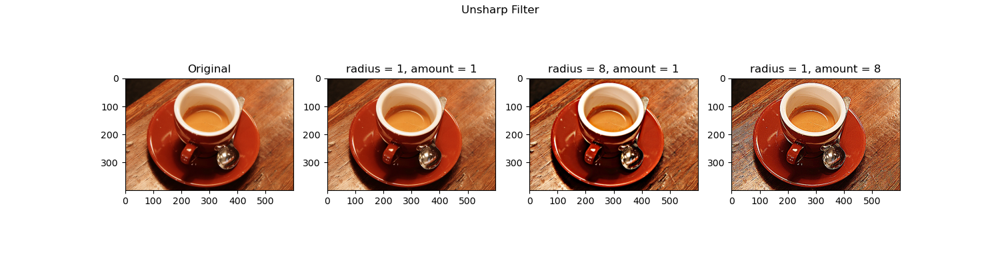

In [77]:
# Unsharp Masking
# Demo - based on https://scikit-image.org/docs/stable/auto_examples/filters/plot_unsharp_mask.html
# Skimage's actual unsharp operator exists

fig_unsharp, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(15, 4))
fig_unsharp.suptitle("Unsharp Filter")

ax1.set_title("Original")
ax1.imshow(skimage.data.coffee())

ax2.set_title("radius = 1, amount = 1")
ax2.imshow(skimage.filters.unsharp_mask(skimage.data.coffee(), radius=1, amount=1))

ax3.set_title("radius = 8, amount = 1")
ax3.imshow(skimage.filters.unsharp_mask(skimage.data.coffee(), radius=8, amount=1))

ax4.set_title("radius = 1, amount = 8")
ax4.imshow(skimage.filters.unsharp_mask(skimage.data.coffee(), radius=1, amount=8))